In [1]:
# Load necessary packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
# Suppress warnings
warnings.filterwarnings('ignore')

In [2]:
# Load the dataset
data=pd.read_excel('World_development_mesurement.xlsx')

In [3]:
# Display the first few rows of the dataset
data.head(10)

,Birth Rate,Business Tax Rate,CO2 Emissions,Country,Days to Start Business,Ease of Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,...,Life Expectancy Male,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
0,0.020,NaN,87931.0,Algeria,NaN,NaN,26998.0,"$54,790,058,957",0.035,$60,...,67.0,0.0,1,0.342,0.619,0.039,31719449,0.599,"$102,000,000","$193,000,000"
1,0.050,NaN,9542.0,Angola,NaN,NaN,7499.0,"$9,129,594,819",0.034,$22,...,44.0,0.0,1,0.476,0.499,0.025,13924930,0.324,"$34,000,000","$146,000,000"
2,0.043,NaN,1617.0,Benin,NaN,NaN,1983.0,"$2,359,122,303",0.043,$15,...,53.0,0.0,1,0.454,0.517,0.029,6949366,0.383,"$77,000,000","$50,000,000"
3,0.027,NaN,4276.0,Botswana,NaN,NaN,1836.0,"$5,788,311,645",0.047,$152,...,49.0,0.1,1,0.383,0.587,0.029,1755375,0.532,"$227,000,000","$209,000,000"
4,0.046,NaN,1041.0,Burkina Faso,NaN,NaN,NaN,"$2,610,959,139",0.051,$12,...,49.0,0.0,1,0.468,0.505,0.028,11607944,0.178,"$23,000,000","$30,000,000"
5,0.042,NaN,301.0,Burundi,NaN,NaN,NaN,"$870,486,066",0.063,$7,...,47.0,0.0,1,0.490,0.481,0.029,6674286,0.082,"$1,400,000","$14,000,000"
6,0.041,NaN,3432.0,Cameroon,NaN,NaN,6310.0,"$9,287,367,569",0.044,$26,...,51.0,0.0,1,0.453,0.513,0.034,15927713,0.455,"$132,000,000","$241,000,000"
7,0.039,NaN,268.0,Central African Republic,NaN,NaN,NaN,"$914,500,332",0.043,$11,...,42.0,0.0,1,0.423,0.537,0.040,3638316,0.376,"$5,000,000","$33,000,000"
8,0.051,NaN,176.0,Chad,NaN,NaN,NaN,"$1,385,058,212",0.063,$10,...,46.0,0.0,1,0.490,0.482,0.028,8301151,0.216,"$14,000,000","$56,000,000"
9,0.039,NaN,84.0,Comoros,NaN,NaN,NaN,"$201,899,884",0.035,$13,...,56.0,NaN,1,0.415,0.554,0.031,528312,0.281,"$15,000,000",NaN


In [4]:
# Total no.of rows and columns
data.shape

(2704, 25)

# 1 . EDA

In [5]:
#Lowering the all variable names and replacing them with the orginal dataframe for easy to access
data.columns=data.columns.str.lower().str.replace(' ','_')

In [6]:
# Display the columns to verify
print(data.columns)

Index(['birth_rate', 'business_tax_rate', 'co2_emissions', 'country',
       'days_to_start_business', 'ease_of_business', 'energy_usage', 'gdp',
       'health_exp_%_gdp', 'health_exp/capita', 'hours_to_do_tax',
       'infant_mortality_rate', 'internet_usage', 'lending_interest',
       'life_expectancy_female', 'life_expectancy_male', 'mobile_phone_usage',
       'number_of_records', 'population_0-14', 'population_15-64',
       'population_65+', 'population_total', 'population_urban',
       'tourism_inbound', 'tourism_outbound'],
      dtype='object')




*   CLEANING THE DATA FRAME IN WHICH SOME OF THE COLUMNS ARE IN STRING WHICH ARE NATURALY NUMERICA


*   BUSSINESS TAX RATE IS IN PERCENTAGE FORM WE HAVE TO CONVERT INTO FLAOT FORM BY REMOVING % SYMBOL AT THE END OF THE COLUMN AND WITH OUT DISTRUBING THE NUMERICAL VALUES
*   GDP,HEALTH/CAP,TOURISM IN AND OUTBOUND ARE  CURENCY TERMS BUT THERE IS DOLLAR SYMBOL IN IT WE HAVE TO REMOVE THE DOLLAR AND COMMA IN BETWEEN THEM AND CONVERT TO NUMERIC

*    WE HAVE TO LOWER THE COUNTRY












In [7]:
#Converting the data in the variable country to lower case
data['country']=data['country'].str.lower()

In [8]:
#Removing the % symbol in the data using rstrip() and converting to datatype to float
data['business_tax_rate']=data['business_tax_rate'].str.rstrip('%').astype(float)

In [9]:
#Removing the unnecessary symbols from the data.
co=['gdp','health_exp/capita','tourism_inbound','tourism_outbound']
for i in co:
  if data[i].dtype=='O':
    data[i]=data[i].str.lstrip('$') # removing the $ symbol
    data[i]=data[i].str.replace(',','') # removing comma in the rows
    data[i]=data[i].astype(float)  # converting the them into float

In [10]:
data

,birth_rate,business_tax_rate,co2_emissions,country,days_to_start_business,ease_of_business,energy_usage,gdp,health_exp_%_gdp,health_exp/capita,...,life_expectancy_male,mobile_phone_usage,number_of_records,population_0-14,population_15-64,population_65+,population_total,population_urban,tourism_inbound,tourism_outbound
0,0.020,NaN,87931.0,algeria,NaN,NaN,26998.0,5.479006e+10,0.035,60.0,...,67.0,0.0,1,0.342,0.619,0.039,31719449,0.599,1.020000e+08,1.930000e+08
1,0.050,NaN,9542.0,angola,NaN,NaN,7499.0,9.129595e+09,0.034,22.0,...,44.0,0.0,1,0.476,0.499,0.025,13924930,0.324,3.400000e+07,1.460000e+08
2,0.043,NaN,1617.0,benin,NaN,NaN,1983.0,2.359122e+09,0.043,15.0,...,53.0,0.0,1,0.454,0.517,0.029,6949366,0.383,7.700000e+07,5.000000e+07
3,0.027,NaN,4276.0,botswana,NaN,NaN,1836.0,5.788312e+09,0.047,152.0,...,49.0,0.1,1,0.383,0.587,0.029,1755375,0.532,2.270000e+08,2.090000e+08
4,0.046,NaN,1041.0,burkina faso,NaN,NaN,NaN,2.610959e+09,0.051,12.0,...,49.0,0.0,1,0.468,0.505,0.028,11607944,0.178,2.300000e+07,3.000000e+07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,NaN,NaN,NaN,turks and caicos islands,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,1,NaN,NaN,NaN,32427,0.911,NaN,NaN
2700,0.013,46.4,NaN,united states,5.0,4.0,2132446.0,1.624460e+13,0.179,8895.0,...,76.0,1.0,1,0.196,0.667,0.136,313873685,0.811,2.000920e+11,1.265730e+11
2701,0.015,41.9,NaN,uruguay,7.0,85.0,NaN,5.000435e+10,0.089,1308.0,...,74.0,1.5,1,0.220,0.639,0.140,3395253,0.948,2.222000e+09,1.028000e+09
2702,0.020,61.9,NaN,"venezuela, rb",144.0,180.0,NaN,3.812862e+11,0.046,593.0,...,72.0,1.0,1,0.288,0.652,0.060,29954782,0.889,9.040000e+08,3.202000e+09


In [11]:
#verifying the data
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2704 entries, 0 to 2703
Data columns (total 25 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   birth_rate              2585 non-null   float64
 1   business_tax_rate       1423 non-null   float64
 2   co2_emissions           2125 non-null   float64
 3   country                 2704 non-null   object 
 4   days_to_start_business  1718 non-null   float64
 5   ease_of_business        185 non-null    float64
 6   energy_usage            1785 non-null   float64
 7   gdp                     2494 non-null   float64
 8   health_exp_%_gdp        2395 non-null   float64
 9   health_exp/capita       2395 non-null   float64
 10  hours_to_do_tax         1416 non-null   float64
 11  infant_mortality_rate   2444 non-null   float64
 12  internet_usage          2531 non-null   float64
 13  lending_interest        1880 non-null   float64
 14  life_expectancy_female  2568 non-null   

In [12]:
# Check for missing values
print(data.isnull().sum())

birth_rate                 119
business_tax_rate         1281
co2_emissions              579
country                      0
days_to_start_business     986
ease_of_business          2519
energy_usage               919
gdp                        210
health_exp_%_gdp           309
health_exp/capita          309
hours_to_do_tax           1288
infant_mortality_rate      260
internet_usage             173
lending_interest           824
life_expectancy_female     136
life_expectancy_male       136
mobile_phone_usage         167
number_of_records            0
population_0-14            220
population_15-64           220
population_65+             220
population_total             0
population_urban            26
tourism_inbound            368
tourism_outbound           471
dtype: int64


In [13]:
# Check for missing values with the percentage of null values for each variable in data
nullvalues=pd.DataFrame(data.isnull().sum(),columns=['null_values'],index=data.columns)
nullvalues['null_percentage']=np.round(nullvalues['null_values']/len(data)*100,2)
nullvalues.sort_values(by='null_values',ascending=False)

,null_values,null_percentage
ease_of_business,2519,93.16
hours_to_do_tax,1288,47.63
business_tax_rate,1281,47.37
days_to_start_business,986,36.46
energy_usage,919,33.99
lending_interest,824,30.47
co2_emissions,579,21.41
tourism_outbound,471,17.42
tourism_inbound,368,13.61
health_exp_%_gdp,309,11.43


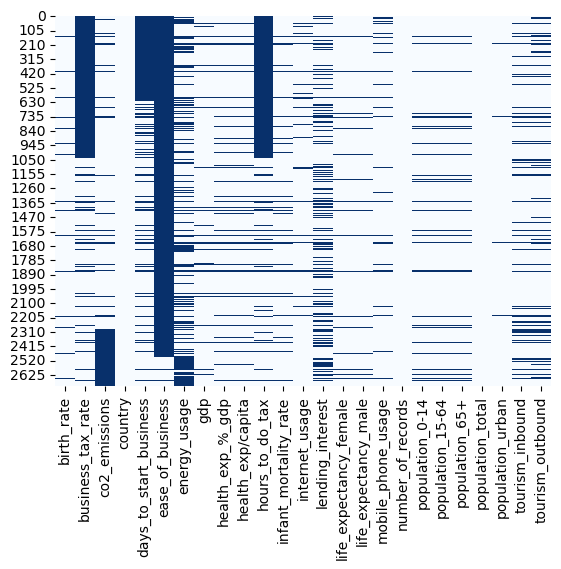

In [14]:
#Visualising the data for null values distriution accross all the variables
sns.heatmap(data.isnull(),cmap='Blues',cbar=False)
plt.show()

In [15]:
#Dropping the variables having max(> 50%) null values
data=data.drop(columns=['ease_of_business'],axis=1)

In [16]:
#Dropping the rows of variables having less than 1% null values in the data
data=data.dropna(subset=['population_urban'],axis=0)

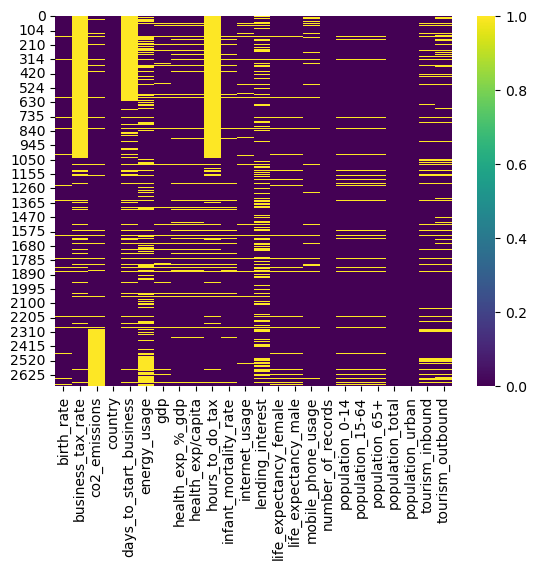

In [17]:
#Visualising the data for null values distriution accross all the variables after droping few rows and columns
sns.heatmap(data.isnull(),cmap='viridis')
plt.show()

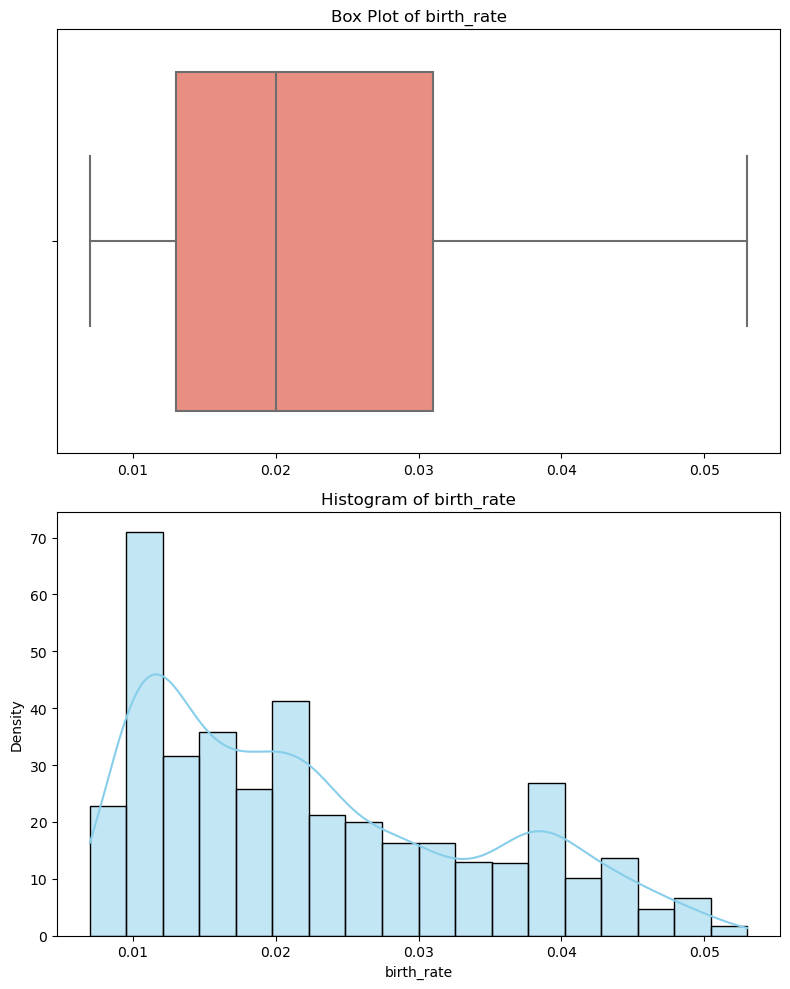

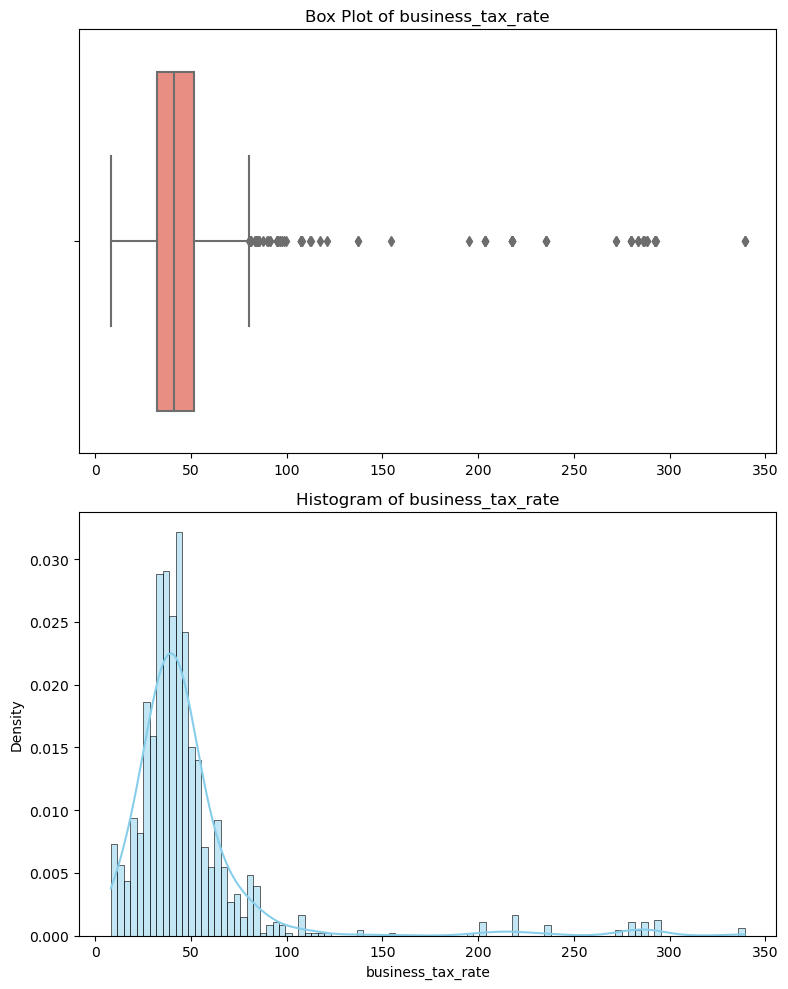

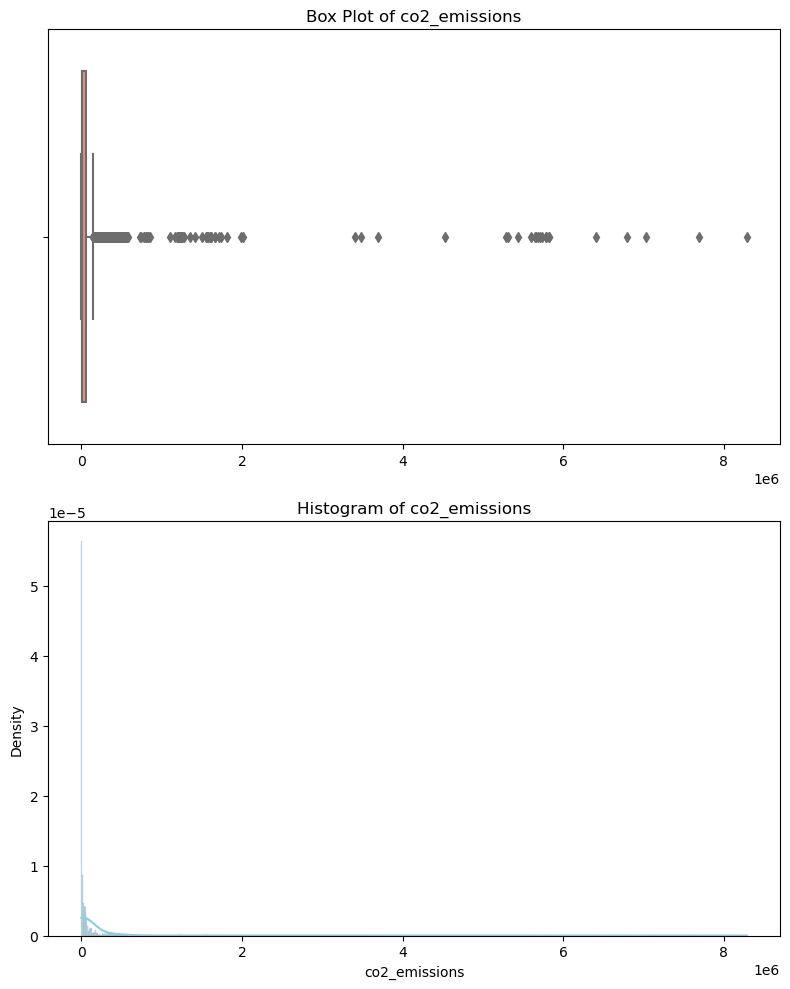

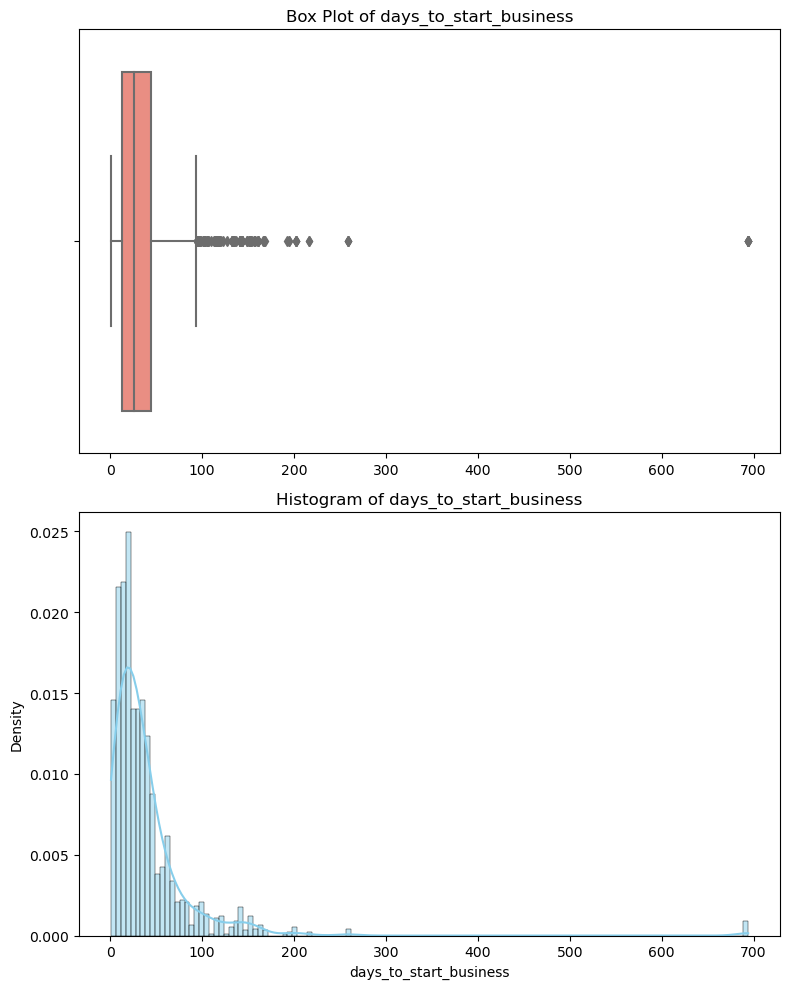

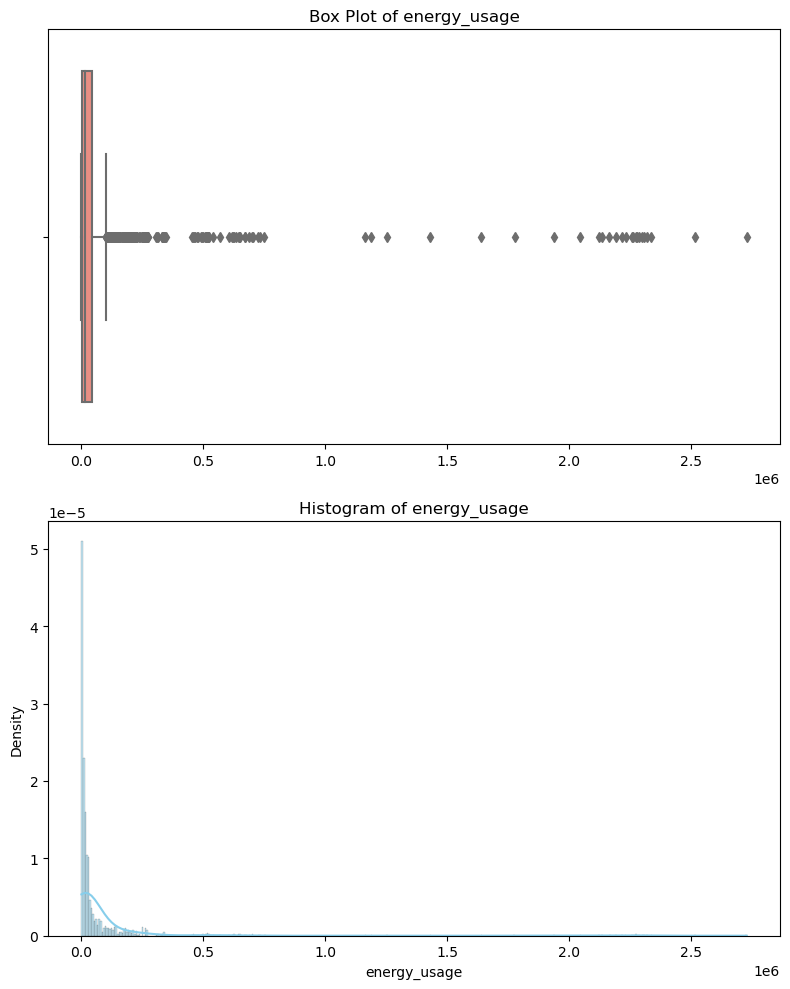

...

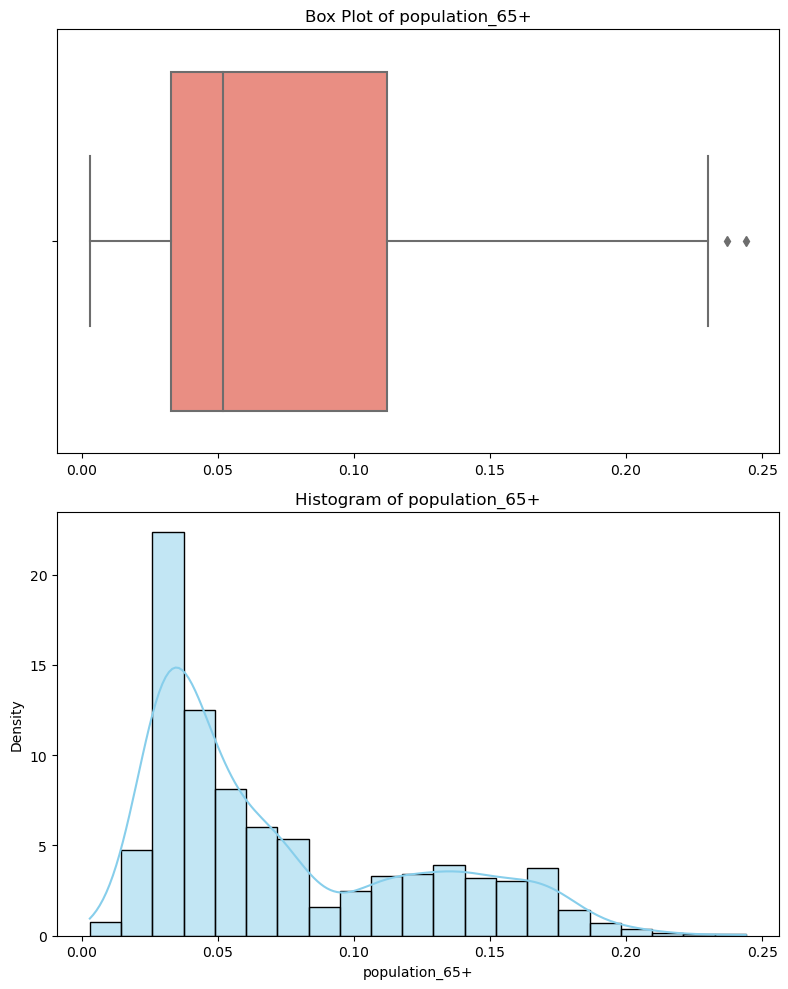

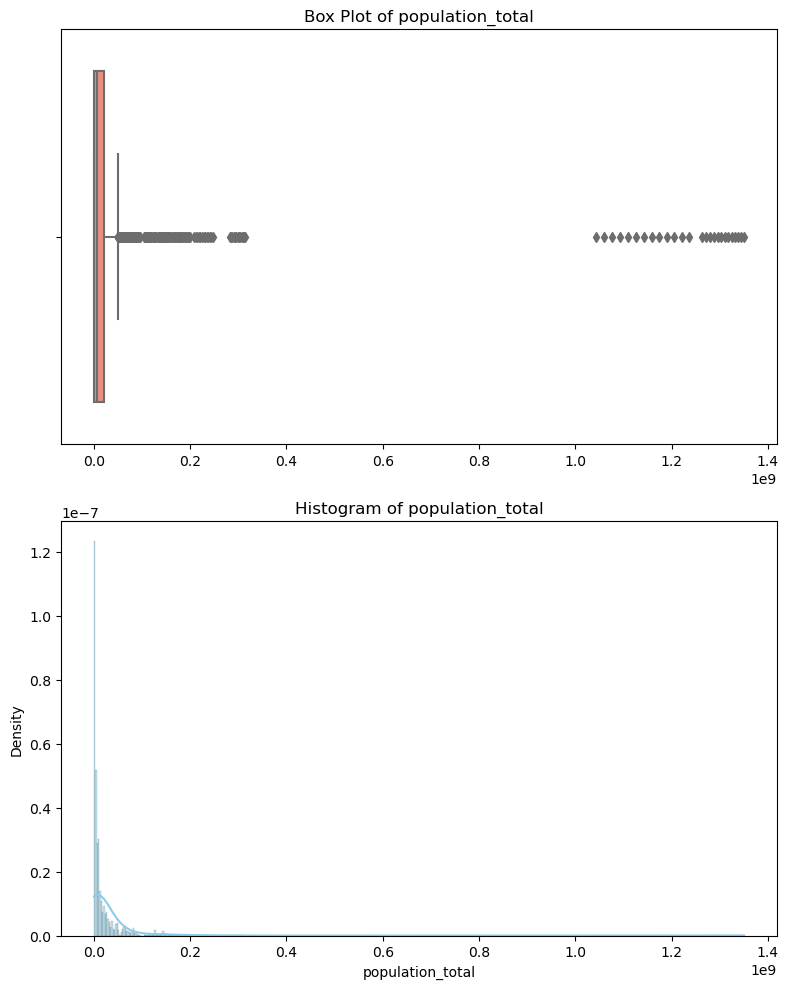

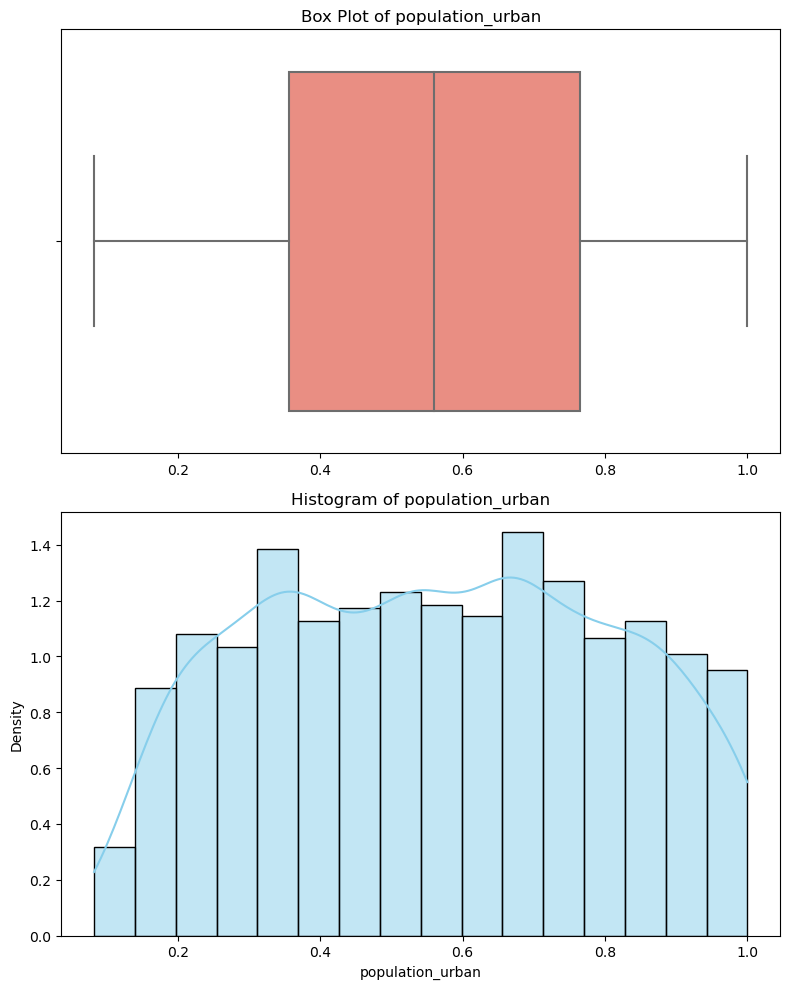

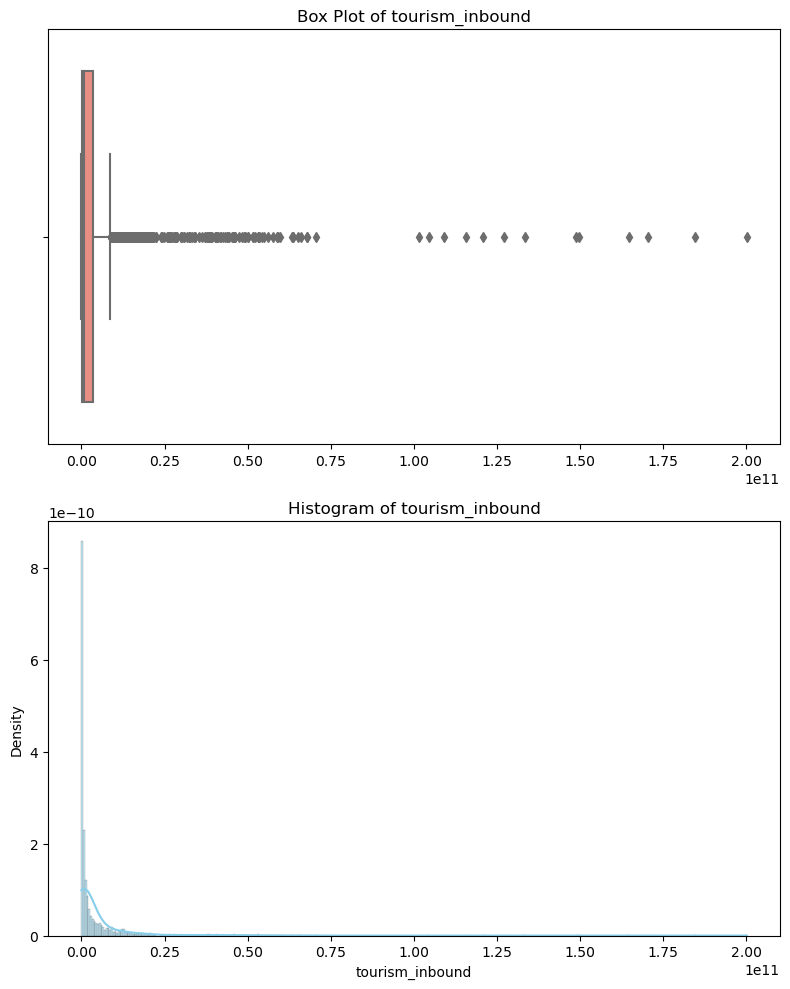

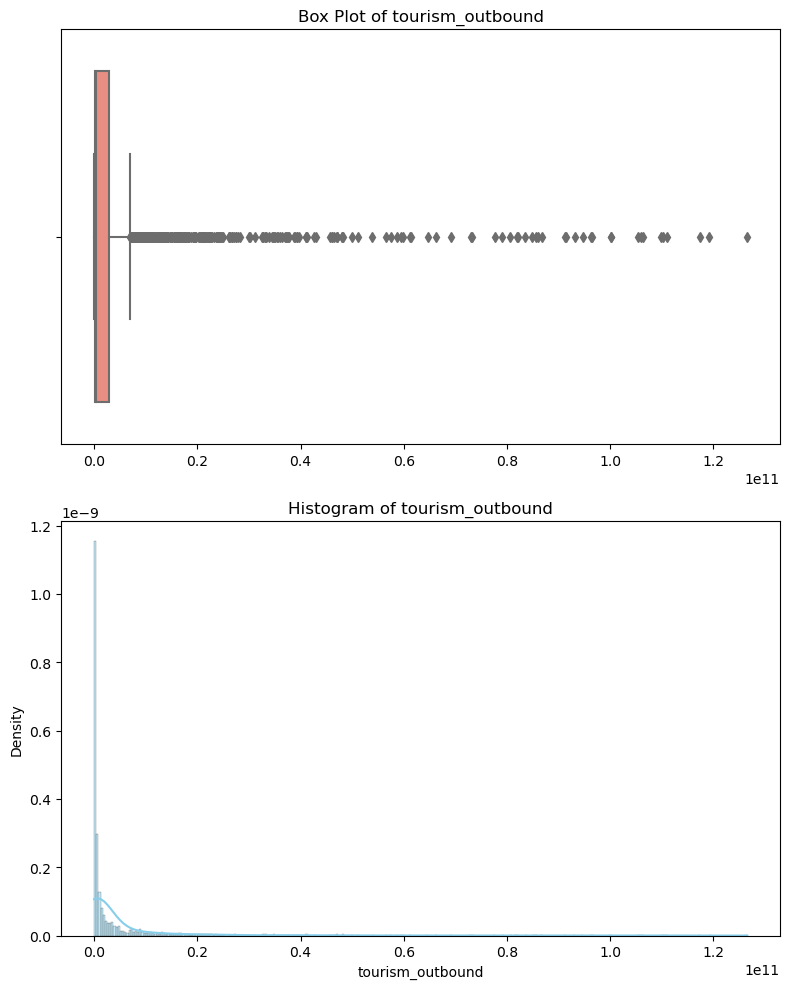

In [18]:
# Function to plot boxplot and histogram
def plot_boxplot_hist(data, column):
    fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(8, 10))  # Create a 2-row grid
    
    # Flatten axes array to simplify indexing
    axes = axes.flatten()
    
    # Box plot
    sns.boxplot(x=data[column], color='salmon', ax=axes[0])
    axes[0].set_title(f'Box Plot of {column}')
    axes[0].set_xlabel('')
    
    # Histogram with KDE
    sns.histplot(data[column], kde=True, stat='density', color='skyblue', ax=axes[1])
    axes[1].set_title(f'Histogram of {column}')
    axes[1].set_xlabel(column)
    
    plt.tight_layout()
    plt.show()

# Plot boxplot and histogram for each numeric column one by one
for col in data.select_dtypes(include=['float64', 'int64']).columns:
    plot_boxplot_hist(data, col)

In [19]:
data.select_dtypes(exclude='object').skew().sort_values()

life_expectancy_female    -0.883067
life_expectancy_male      -0.695629
population_15-64          -0.186309
number_of_records          0.000000
population_urban           0.012519
population_0-14            0.059339
mobile_phone_usage         0.569605
birth_rate                 0.649706
population_65+             0.919509
internet_usage             0.940966
infant_mortality_rate      1.049118
health_exp_%_gdp           1.179757
health_exp/capita          2.817482
business_tax_rate          4.341711
hours_to_do_tax            4.485939
tourism_outbound           5.210304
energy_usage               7.038776
tourism_inbound            7.114871
days_to_start_business     7.432583
co2_emissions              8.654039
population_total           8.746586
gdp                        9.400041
lending_interest          15.498629
dtype: float64

In [20]:
import pandas as pd
import numpy as np

# Assuming 'df' is your DataFrame
# List of columns categorized based on their skewness

# Symmetrical or Approximately Symmetrical Features
symmetrical_columns = ['number_of_records', 'population_urban', 'population_0-14', 'population_15-64']

# Moderately Skewed Features
moderately_skewed_columns = ['life_expectancy_female', 'life_expectancy_male', 'mobile_phone_usage', 
                             'birth_rate', 'population_65+', 'internet_usage', 'infant_mortality_rate']

# Highly Skewed Features
highly_skewed_columns = ['health_exp_%_gdp', 'health_exp/capita', 'business_tax_rate', 
                         'hours_to_do_tax', 'tourism_outbound', 'energy_usage', 
                         'tourism_inbound', 'days_to_start_business', 'co2_emissions', 
                         'population_total', 'gdp', 'lending_interest']

# Imputing null values for each group
# 1. Impute mean for symmetrical columns
for col in symmetrical_columns:
  data[col].fillna(data[col].mean(), inplace=True)

# 2. Impute median for moderately skewed columns
for col in moderately_skewed_columns:
    data[col].fillna(data[col].median(), inplace=True)

# 3. Impute median for highly skewed columns
for col in highly_skewed_columns:
    data[col].fillna(data[col].median(), inplace=True)

# Print to confirm that null values have been filled
print("Null values imputed successfully.")


Null values imputed successfully.


In [21]:
data.isnull().sum()

birth_rate                0
business_tax_rate         0
co2_emissions             0
country                   0
days_to_start_business    0
energy_usage              0
gdp                       0
health_exp_%_gdp          0
health_exp/capita         0
hours_to_do_tax           0
infant_mortality_rate     0
internet_usage            0
lending_interest          0
life_expectancy_female    0
life_expectancy_male      0
mobile_phone_usage        0
number_of_records         0
population_0-14           0
population_15-64          0
population_65+            0
population_total          0
population_urban          0
tourism_inbound           0
tourism_outbound          0
dtype: int64

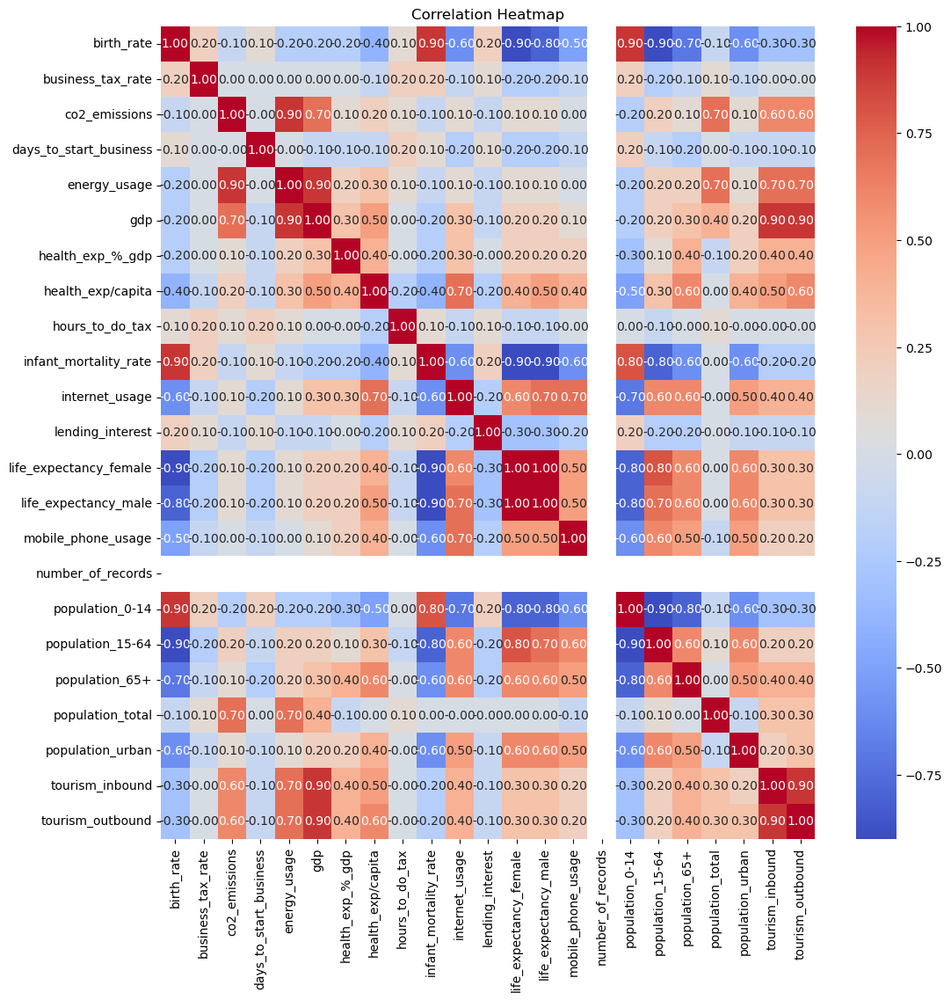

In [22]:
# Create correlation heatmap
corr=round(data.select_dtypes(exclude='object').corr(),1)
plt.figure(figsize=(12, 12))
sns.heatmap(data=corr, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap')
plt.show()

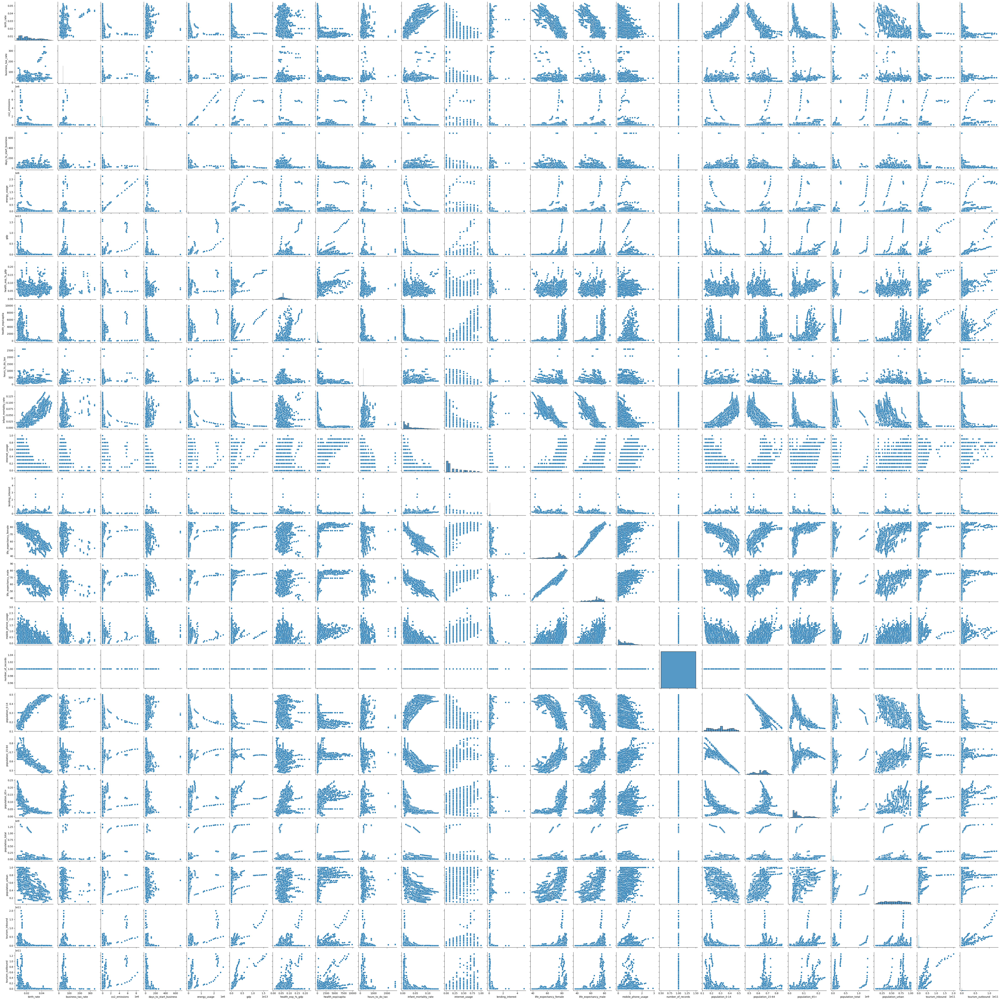

In [23]:
# Create scatter plots for all pairs of variables
sns.pairplot(data)
plt.show()

#we are imputing outliers with median using IQR menthod of impution

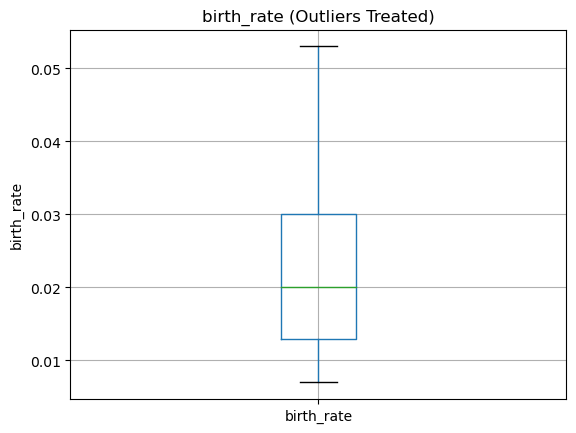

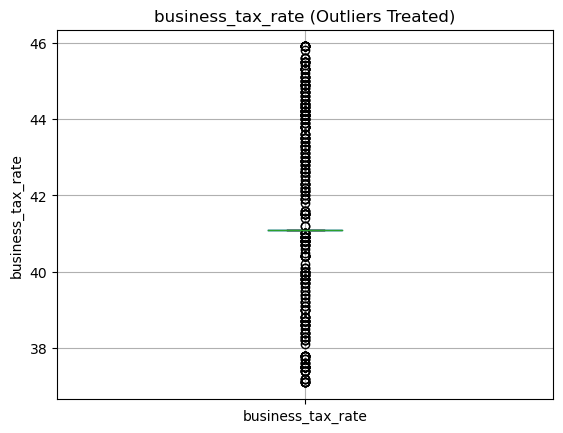

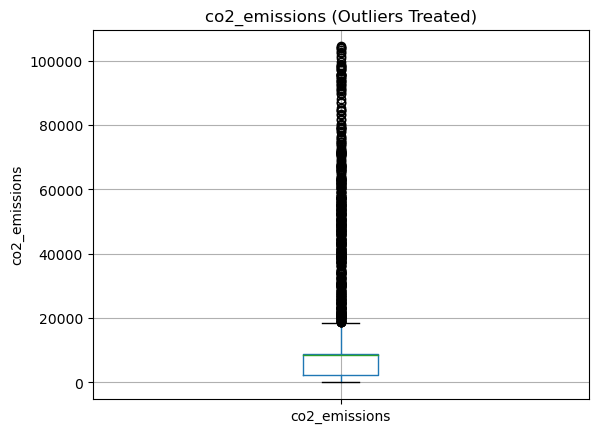

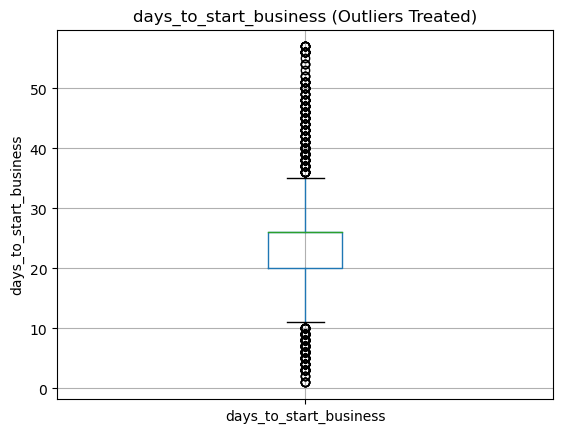

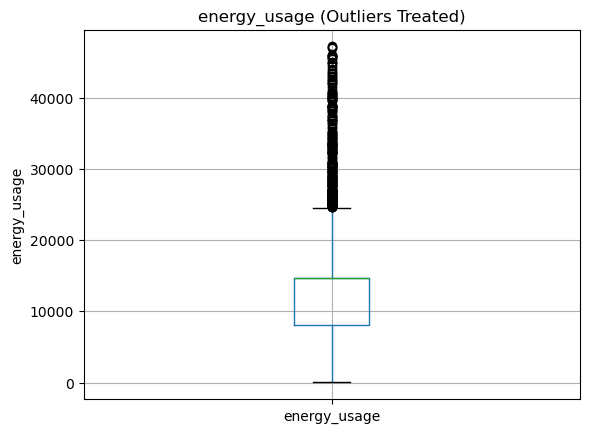

...

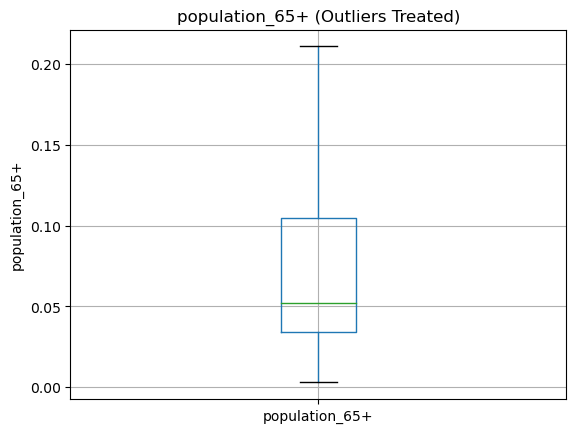

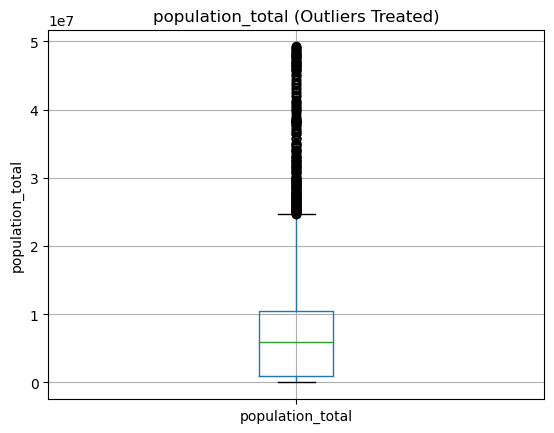

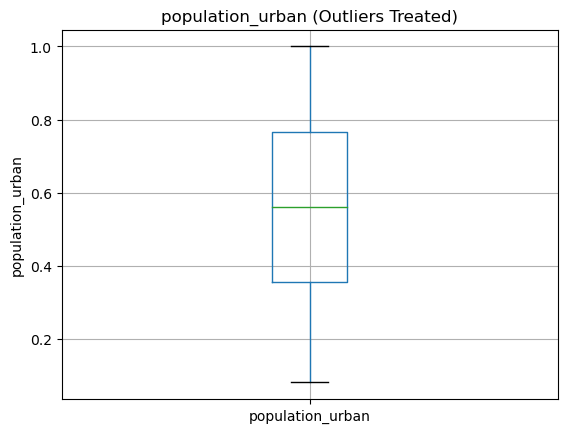

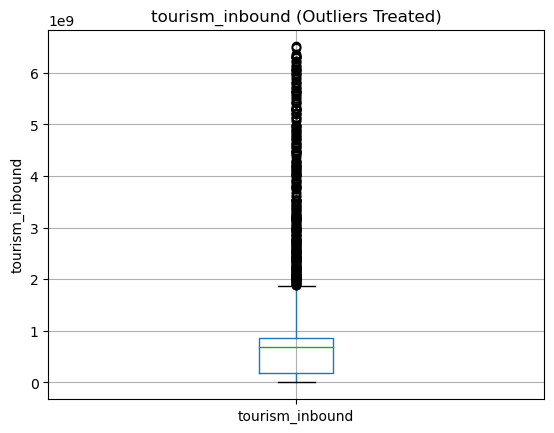

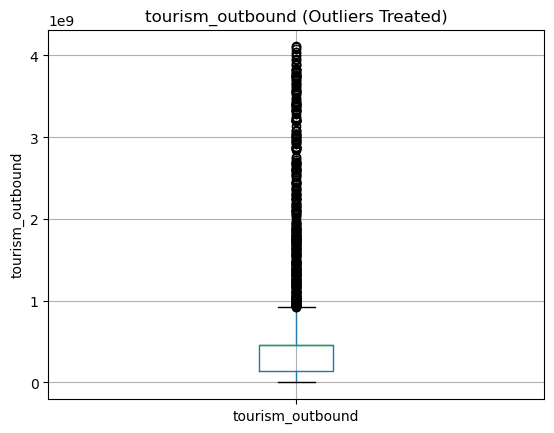

In [24]:
#Here we treating outliers by imputing median and visualising through boxplots for better understading
for feature in data.columns:
    # Check if the column is numeric
    if pd.api.types.is_numeric_dtype(data[feature]):
        # Check if 0 is in the unique values
        if 0 in data[feature].unique():
            continue
        else:
            # Treat outliers by replacing them with the median
            median = data[feature].median()
            q1 = data[feature].quantile(0.25)
            q3 = data[feature].quantile(0.75)
            iqr = q3 - q1
            lower_bound = q1 - 1.5 * iqr
            upper_bound = q3 + 1.5 * iqr
            # Replace outliers with the median
            data.loc[data[feature] < lower_bound, feature] = median
            data.loc[data[feature] > upper_bound, feature] = median

            # Display boxplot after treating outliers
            data.boxplot(column=feature)
            plt.ylabel(feature)
            plt.title(f"{feature} (Outliers Treated)")
            plt.show()


# **<h2>Model_Building**

In [25]:
x=data.drop('country',axis=1)

In [26]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
data = scaler.fit_transform(x)
data = pd.DataFrame(data, columns=x.columns)


# **<H2>hierarchical Clustring**

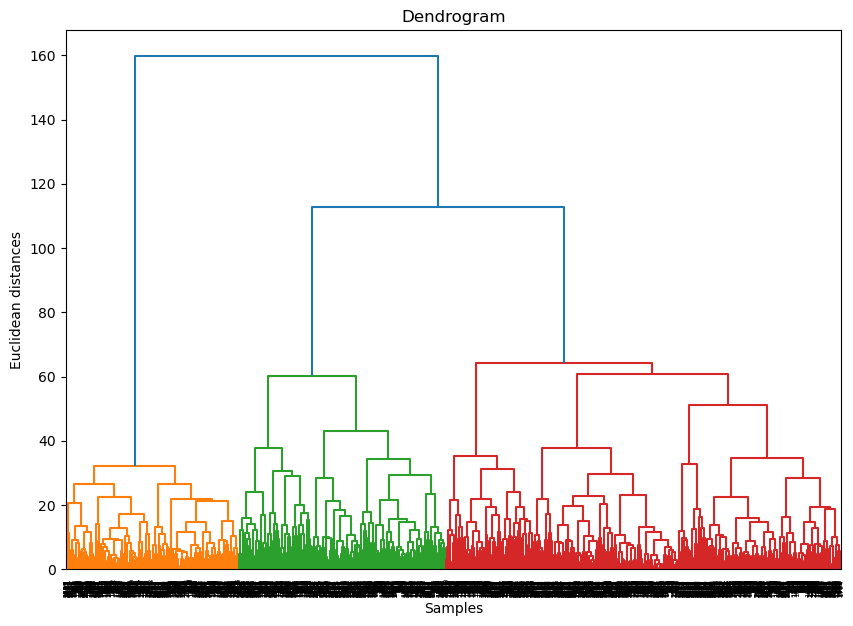

In [27]:
import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering
import matplotlib.pyplot as plt


plt.figure(figsize=(10, 7))
dendrogram = sch.dendrogram(sch.linkage(data, method='ward'))
plt.title('Dendrogram')
plt.xlabel('Samples')
plt.ylabel('Euclidean distances')
plt.show()


**from above  dendrogram we can Choose the number of clusters is 3**

In [28]:
n_clusters=3
from sklearn.cluster import AgglomerativeClustering
hc = AgglomerativeClustering(n_clusters=n_clusters, metric='euclidean', linkage='ward')
clusters = hc.fit_predict(data)
data['Hirechiecial_Cluster'] = clusters


In [29]:
from sklearn.metrics import silhouette_score

silhouette_avg = silhouette_score(data.drop('Hirechiecial_Cluster', axis=1), data['Hirechiecial_Cluster'])

print(f"Silhouette Score for {n_clusters} clusters: {silhouette_avg}")

Silhouette Score for 3 clusters: 0.14903680026117402


# **<h2>K-means Clustring**

In [30]:
data1=data.drop('Hirechiecial_Cluster',axis=1)

**finding optimal number of clusters using elbow method**

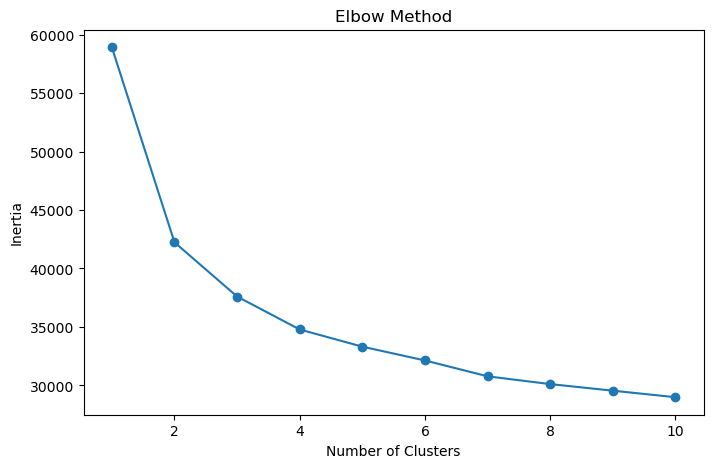

In [31]:
from sklearn.cluster import KMeans
inertia = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(data1)
    inertia.append(kmeans.inertia_)

plt.figure(figsize=(8, 5))
plt.plot(range(1, 11), inertia, marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.show()


**By above elbow curve we choose optimal number of clusters are 5**

In [32]:
n_clusters = 5
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans_clusters = kmeans.fit_predict(data1)

data1['KMeans_Cluster'] = kmeans_clusters


kmeans_silhouette_score = silhouette_score(data1, kmeans_clusters)
print(f"K-Means Silhouette Score for {n_clusters} clusters: {kmeans_silhouette_score}")

K-Means Silhouette Score for 5 clusters: 0.21829640315331839


# **<h2>DB-SCAN Model**

In [33]:
data2=data1.drop('KMeans_Cluster',axis=1)

**finding optimal value of epsion(eps)using  k-distance graph.**

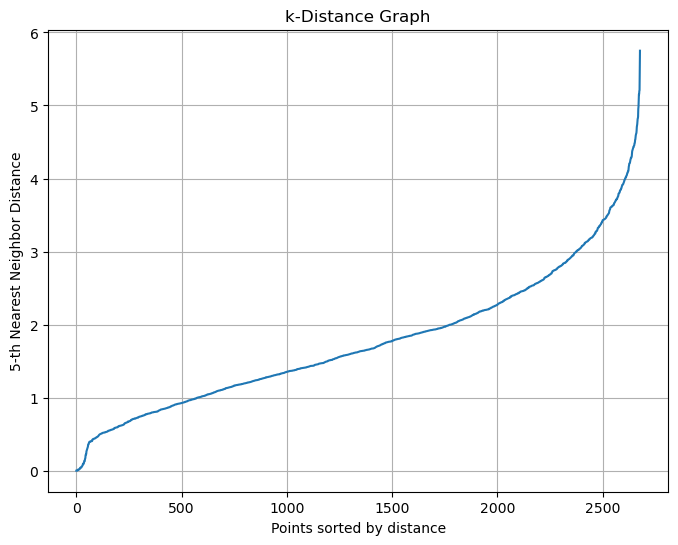

In [34]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors

min_samples = 5

neighbors = NearestNeighbors(n_neighbors=min_samples)
neighbors_fit = neighbors.fit(data2)
distances, indices = neighbors_fit.kneighbors(data2)

distances = np.sort(distances[:, min_samples-1], axis=0)

plt.figure(figsize=(8, 6))
plt.plot(distances)
plt.title('k-Distance Graph')
plt.xlabel('Points sorted by distance')
plt.ylabel(f'{min_samples}-th Nearest Neighbor Distance')
plt.grid(True)
plt.show()

**From above k-distance graph best eps value is 4.5**

In [35]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score

dbscan = DBSCAN(eps=4.5, min_samples=23) 
dbscan_clusters = dbscan.fit_predict(data2)

data2['DBSCAN_Cluster'] = dbscan_clusters

silhouette_avg_dbscan = silhouette_score(data2, dbscan_clusters)
print(f"DBSCAN Silhouette Score: {silhouette_avg_dbscan}")

DBSCAN Silhouette Score: 0.29952437773353646


**We find best the  Acuuracy in Dbscan Model**